In [1]:
%matplotlib inline

### Imports

In [2]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import random
import torchvision.transforms.functional as TF
from PIL import Image

# Set random seeds for reproducibility
random.seed(42)
np.random.seed(42)
torch.manual_seed(42)

device = torch.device('cuda' if torch.cuda.is_available() else 
                      'mps' if torch.backends.mps.is_available() else 'cpu')
print(f"Using device: {device}")

Using device: mps


## Helper train model function

In [3]:
def train_model(model, train_loader, val_loader, num_epochs=50, lr=0.001, label="Model"):
    """Train a model and return training history"""
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=lr)
    
    history = {
        'train_loss': [], 'val_loss': [],
        'train_acc': [], 'val_acc': []
    }
    
    print(f"Training {label}...")
    print("-" * 70)
    
    for epoch in range(num_epochs):
        # Training
        model.train()
        running_loss = 0.0
        correct = 0
        total = 0
        
        for img_batch, mask_batch in train_loader:
            img_batch = img_batch.to(device)
            mask_batch = mask_batch.to(device)
            
            outputs = model(img_batch)
            loss = criterion(outputs, mask_batch)
            
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
            
            running_loss += loss.item()
            preds = outputs.argmax(dim=1)
            correct += (preds == mask_batch).sum().item()
            total += mask_batch.numel()
        
        train_loss = running_loss / len(train_loader)
        train_acc = 100 * correct / total
        history['train_loss'].append(train_loss)
        history['train_acc'].append(train_acc)
        
        # Validation
        model.eval()
        val_loss = 0.0
        correct = 0
        total = 0
        with torch.no_grad():
            for img_batch, mask_batch in val_loader:
                img_batch = img_batch.to(device)
                mask_batch = mask_batch.to(device)
                outputs = model(img_batch)
                loss = criterion(outputs, mask_batch)
                val_loss += loss.item()
                preds = outputs.argmax(dim=1)
                correct += (preds == mask_batch).sum().item()
                total += mask_batch.numel()
        
        val_loss /= len(val_loader)
        val_acc = 100 * correct / total
        history['val_loss'].append(val_loss)
        history['val_acc'].append(val_acc)
        
        print(f"Epoch {epoch+1:2d}/{num_epochs} | "
              f"Train Loss: {train_loss:.4f} | Train Acc: {train_acc:.2f}% | "
              f"Val Loss: {val_loss:.4f} | Val Acc: {val_acc:.2f}%")
    
    print("-" * 70)
    print(f"{label} complete!\n")
    return history

print("train_model function defined")

train_model function defined


### Load image and mask

Image shape: (682, 1024, 3)
Mask shape: (682, 1024, 3)


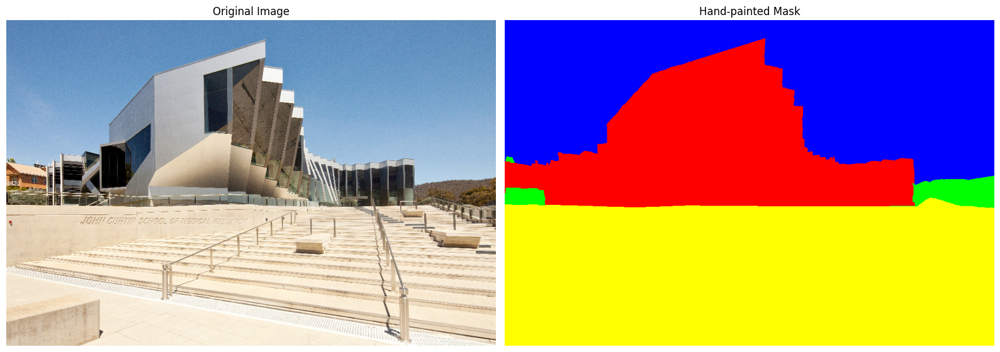

In [4]:
# Load the original image
image = cv2.imread('image_data.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
image = cv2.resize(image, (1024, 682))



# Ground truth for evaluation: hand-drawn mask
mask_gt_image = cv2.imread('mask.png')
mask_gt_image = cv2.cvtColor(mask_gt_image, cv2.COLOR_BGR2RGB)
mask_gt_image = cv2.resize(mask_gt_image, (1024, 682), interpolation=cv2.INTER_NEAREST)

print(f"Image shape: {image.shape}")
print(f"Mask shape: {mask_gt_image.shape}")

# Show both side by side
fig, axes = plt.subplots(1, 2, figsize=(16, 6))
axes[0].imshow(image)
axes[0].set_title("Original Image")
axes[0].axis('off')
axes[1].imshow(mask_gt_image)
axes[1].set_title("Hand-painted Mask")
axes[1].axis('off')
plt.tight_layout()
plt.show()

In [5]:
# ── Auto-label with SegFormer b4 (better quality labels) ─────────────────────
from transformers import SegformerImageProcessor, SegformerForSemanticSegmentation
from PIL import Image
import numpy as np
import torch
import cv2
import matplotlib.pyplot as plt

# Load model - b4 is significantly more accurate than b0
processor = SegformerImageProcessor.from_pretrained("nvidia/segformer-b4-finetuned-ade-512-512")
model_seg = SegformerForSemanticSegmentation.from_pretrained("nvidia/segformer-b4-finetuned-ade-512-512")
model_seg.eval()

# Run inference
image_pil = Image.open("image_data.jpg").convert("RGB")
inputs = processor(images=image_pil, return_tensors="pt")
with torch.no_grad():
    logits = model_seg(**inputs).logits

upsampled = torch.nn.functional.interpolate(
    logits, size=(682, 1024), mode="bilinear", align_corners=False
)
ade_pred = upsampled.argmax(dim=1).squeeze().numpy()

# ── Diagnostic ──
unique, counts = np.unique(ade_pred, return_counts=True)
top = sorted(zip(counts, unique), reverse=True)[:20]
print("Top 20 ADE classes in this image:")
for count, cls_id in top:
    name = model_seg.config.id2label[cls_id]
    pct = count / ade_pred.size * 100
    print(f"  [{cls_id:3d}] {name:<30} {pct:.1f}%")

preprocessor_config.json:   0%|          | 0.00/271 [00:00<?, ?B/s]

config.json: 0.00B [00:00, ?B/s]

pytorch_model.bin:   0%|          | 0.00/257M [00:00<?, ?B/s]

Loading weights:   0%|          | 0/930 [00:00<?, ?it/s]

model.safetensors:   0%|          | 0.00/257M [00:00<?, ?B/s]

Top 20 ADE classes in this image:
  [  2] sky                            33.3%
  [ 53] stairs                         22.9%
  [  1] building                       21.9%
  [ 11] sidewalk                       9.9%
  [  0] wall                           7.4%
  [ 95] bannister                      3.2%
  [ 16] mountain                       0.7%
  [  4] tree                           0.4%
  [ 17] plant                          0.2%
  [  3] floor                          0.1%
  [121] step                           0.0%


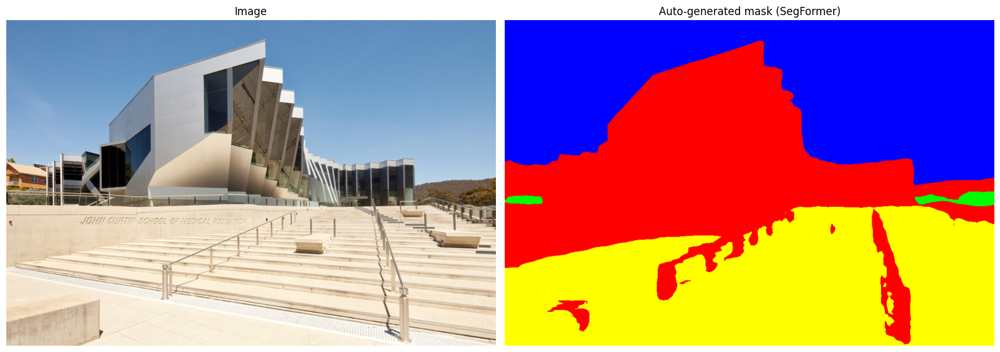

In [6]:
ADE_TO_YOURS = {
    # SKY
    2: 1,
    # VEGETATION
    4: 2, 9: 2, 17: 2, 66: 2, 96: 2,
    # GROUND / pavement / stairs
    3: 3, 6: 3, 11: 3, 13: 3, 29: 3, 53: 3, 59: 3, 52: 3, 87: 3, 51: 3,
    # BUILDING
    0: 0, 1: 0, 25: 0, 48: 0, 84: 0,
}

label_auto = np.zeros_like(ade_pred, dtype=np.uint8)
for ade_cls, your_cls in ADE_TO_YOURS.items():
    label_auto[ade_pred == ade_cls] = your_cls

colour_map = np.array([
    [255, 0,   0  ],
    [0,   0,   255],
    [0,   255, 0  ],
    [255, 255, 0  ],
], dtype=np.uint8)

mask_rgb = colour_map[label_auto]
cv2.imwrite("mask_auto.png", mask_rgb)

fig, axes = plt.subplots(1, 2, figsize=(16, 6))
axes[0].imshow(np.array(image_pil.resize((1024, 682))))
axes[0].set_title("Image")
axes[0].axis("off")
axes[1].imshow(mask_rgb)
axes[1].set_title("Auto-generated mask (SegFormer)")
axes[1].axis("off")
plt.tight_layout()
plt.show()

preprocessor_config.json:   0%|          | 0.00/380 [00:00<?, ?B/s]

config.json: 0.00B [00:00, ?B/s]

tokenizer_config.json:   0%|          | 0.00/974 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/603M [00:00<?, ?B/s]

Loading weights:   0%|          | 0/462 [00:00<?, ?it/s]

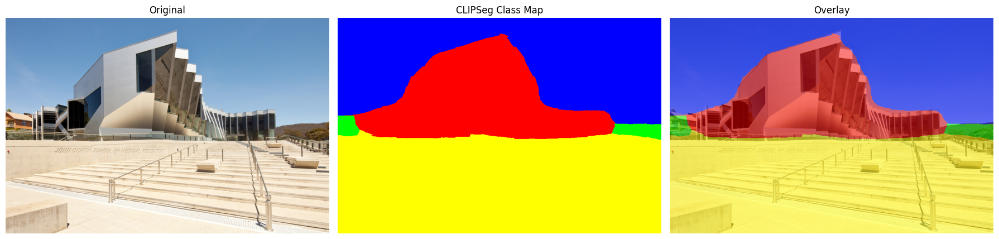


Class distribution:
  building: 21.1%
  sky: 32.8%
  vegetation: 1.4%
  ground: 44.7%

Saved mask_auto.png


In [10]:
# ── Auto-label with CLIPSeg (text-prompted segmentation) ─────────────────────
from transformers import CLIPSegProcessor, CLIPSegForImageSegmentation
from PIL import Image
import numpy as np
import torch
import cv2
import matplotlib.pyplot as plt

# Load CLIPSeg
processor = CLIPSegProcessor.from_pretrained("CIDAS/clipseg-rd64-refined")
model_seg = CLIPSegForImageSegmentation.from_pretrained("CIDAS/clipseg-rd64-refined")
model_seg.eval()

# Define text prompts for each class
# Order matches CLASS_NAMES: building=0, sky=1, vegetation=2, ground=3
prompts = [
    "the metallic angular building structure",       # building
    "the blue sky above",                            # sky
    "trees, plants, hills, and vegetation",          # vegetation
    "the concrete stairs and ground floor"           # ground
]

# Load image
image_pil = Image.open("image_data.jpg").convert("RGB")
image_pil_resized = image_pil.resize((1024, 682))

# Run CLIPSeg for each prompt
with torch.no_grad():
    inputs = processor(text=prompts, images=[image_pil_resized] * len(prompts), 
                       return_tensors="pt", padding=True)
    outputs = model_seg(**inputs)
    
# Get probability maps for each class
probs = torch.sigmoid(outputs.logits)  # [4, H, W]
probs_resized = torch.nn.functional.interpolate(
    probs.unsqueeze(1), size=(682, 1024), mode='bilinear', align_corners=False
).squeeze(1).numpy()

# For each pixel, pick the class with highest probability
label_map = probs_resized.argmax(axis=0).astype(np.int64)

# Visualize
class_colors = np.array([
    [255, 0, 0],
    [0, 0, 255],
    [0, 255, 0],
    [255, 255, 0],
]) / 255.0

color_map = class_colors[label_map]

fig, axes = plt.subplots(1, 3, figsize=(18, 6))
axes[0].imshow(np.array(image_pil_resized))
axes[0].set_title("Original")
axes[0].axis('off')

axes[1].imshow(color_map)
axes[1].set_title("CLIPSeg Class Map")
axes[1].axis('off')

axes[2].imshow(np.array(image_pil_resized))
axes[2].imshow(color_map, alpha=0.5)
axes[2].set_title("Overlay")
axes[2].axis('off')

plt.tight_layout()
plt.show()

# Print distribution
CLASS_NAMES = ['building', 'sky', 'vegetation', 'ground']
print("\nClass distribution:")
for i, name in enumerate(CLASS_NAMES):
    pct = (label_map == i).sum() / label_map.size * 100
    print(f"  {name}: {pct:.1f}%")

# Save as image
mask_rgb = (color_map * 255).astype(np.uint8)
mask_bgr = cv2.cvtColor(mask_rgb, cv2.COLOR_RGB2BGR)
cv2.imwrite("mask_auto.png", mask_bgr)
print("\nSaved mask_auto.png")

## Use the generated mask as the `mask_image`

In [7]:
mask_image = cv2.imread('mask_auto.png')

In [8]:
print("Unique colours in mask_auto:")
pixels = mask_image.reshape(-1, 3)
unique_colors = np.unique(pixels, axis=0)
print(unique_colors)

Unique colours in mask_auto:
[[  0   0 255]
 [  0 255   0]
 [255   0   0]
 [255 255   0]]


Class distribution:
  building: 33.2%
  sky: 33.3%
  vegetation: 0.6%
  ground: 32.9%


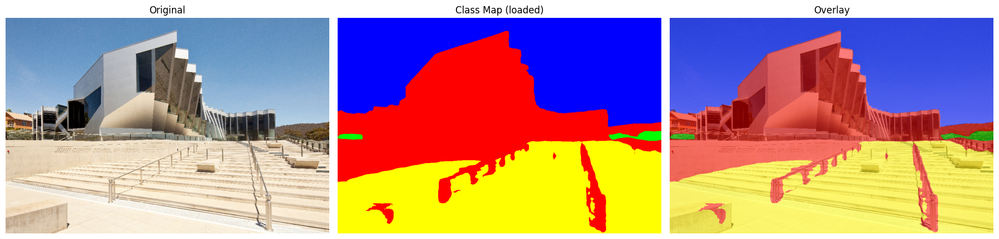

In [9]:
# Your colour to class mapping
# Red (255,0,0) = building (0)
# Blue (0,0,255) = sky (1)
# Green (0,255,0) = vegetation (2)
# Yellow (255,255,0) = ground (3)

CLASS_NAMES = ['building', 'sky', 'vegetation', 'ground']
NUM_CLASSES = 4

# Convert RGB mask to single-channel class label map
def rgb_to_class(mask_rgb):
    h, w, _ = mask_rgb.shape
    labels = np.zeros((h, w), dtype=np.int64)
    
    r = mask_rgb[:, :, 0]
    g = mask_rgb[:, :, 1]
    b = mask_rgb[:, :, 2]
    
    # Building: red dominant
    labels[(r > 200) & (g < 100) & (b < 100)] = 0
    # Sky: blue dominant
    labels[(b > 200) & (r < 100) & (g < 100)] = 1
    # Vegetation: green dominant
    labels[(g > 200) & (r < 100) & (b < 100)] = 2
    # Ground: red AND green high (yellow)
    labels[(r > 200) & (g > 200) & (b < 100)] = 3
    
    return labels

label_map = rgb_to_class(mask_image)

# Ground truth for evaluation only
mask_gt_image = cv2.imread('mask.png')
mask_gt_image = cv2.cvtColor(mask_gt_image, cv2.COLOR_BGR2RGB)
mask_gt_image = cv2.resize(mask_gt_image, (1024, 682), interpolation=cv2.INTER_NEAREST)
label_map_gt = rgb_to_class(mask_gt_image)

# Show class distribution
print("Class distribution:")
for i, name in enumerate(CLASS_NAMES):
    pct = (label_map == i).sum() / label_map.size * 100
    print(f"  {name}: {pct:.1f}%")

# Visualize the class map
class_colors = np.array([
    [255, 0, 0],    # building - red
    [0, 0, 255],    # sky - blue
    [0, 255, 0],    # vegetation - green
    [255, 255, 0],  # ground - yellow
]) / 255.0

color_map = class_colors[label_map]

fig, axes = plt.subplots(1, 3, figsize=(18, 6))
axes[0].imshow(image)
axes[0].set_title("Original")
axes[0].axis('off')
axes[1].imshow(color_map)
axes[1].set_title("Class Map (loaded)")
axes[1].axis('off')
axes[2].imshow(image)
axes[2].imshow(color_map, alpha=0.5)
axes[2].set_title("Overlay")
axes[2].axis('off')
plt.tight_layout()
plt.show()

## Split the data for training and testing

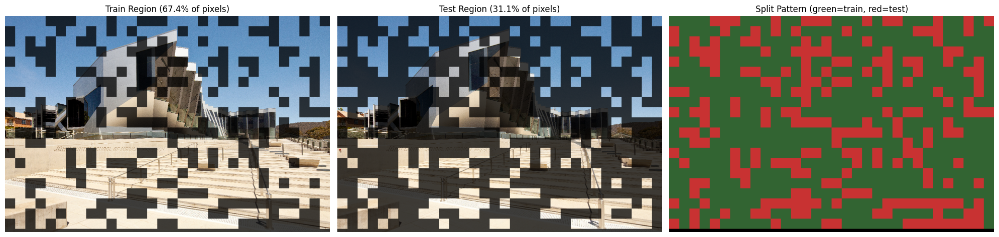


Train region class distribution:
  building: 35.0%
  sky: 34.1%
  vegetation: 1.3%
  ground: 29.6%

Test region class distribution:
  building: 24.1%
  sky: 32.3%
  vegetation: 1.8%
  ground: 41.8%


In [43]:
# Block-based spatial train/test split
# Divide image into blocks, randomly assign each block to train or test
np.random.seed(42)  # for reproducibility

block_size = 32
h, w, _ = image.shape

# Number of blocks
n_blocks_h = h // block_size
n_blocks_w = w // block_size

# Random assignment
block_assignment = np.random.rand(n_blocks_h, n_blocks_w) > 0.3  # True = train (70%), False = test (30%)

# Create train/test masks at pixel level
train_mask = np.zeros((h, w), dtype=bool)
test_mask = np.zeros((h, w), dtype=bool)

for by in range(n_blocks_h):
    for bx in range(n_blocks_w):
        y_start = by * block_size
        y_end = (by + 1) * block_size
        x_start = bx * block_size
        x_end = (bx + 1) * block_size
        
        if block_assignment[by, bx]:
            train_mask[y_start:y_end, x_start:x_end] = True
        else:
            test_mask[y_start:y_end, x_start:x_end] = True

# Visualise the split
fig, axes = plt.subplots(1, 3, figsize=(20, 6))

# Show train regions
train_viz = image.copy()
train_viz[~train_mask] = train_viz[~train_mask] // 4  # darken non-train regions
axes[0].imshow(train_viz)
axes[0].set_title(f"Train Region ({train_mask.mean()*100:.1f}% of pixels)")
axes[0].axis('off')

# Show test regions
test_viz = image.copy()
test_viz[~test_mask] = test_viz[~test_mask] // 4
axes[1].imshow(test_viz)
axes[1].set_title(f"Test Region ({test_mask.mean()*100:.1f}% of pixels)")
axes[1].axis('off')

# Show the split pattern
split_viz = np.zeros_like(image)
split_viz[train_mask] = [50, 100, 50]   # green for train
split_viz[test_mask] = [200, 50, 50]    # red for test
axes[2].imshow(split_viz)
axes[2].set_title("Split Pattern (green=train, red=test)")
axes[2].axis('off')

plt.tight_layout()
plt.savefig('train_test_split.png', dpi=150, bbox_inches='tight')
plt.show()

# Print class distributions
print("\nTrain region class distribution:")
for i, name in enumerate(CLASS_NAMES):
    in_train = ((label_map == i) & train_mask).sum()
    total_train = train_mask.sum()
    pct = in_train / total_train * 100
    print(f"  {name}: {pct:.1f}%")

print("\nTest region class distribution:")
for i, name in enumerate(CLASS_NAMES):
    in_test = ((label_map_gt == i) & test_mask).sum()
    total_test = test_mask.sum()
    pct = in_test / total_test * 100
    print(f"  {name}: {pct:.1f}%")

## Build the dataset

In [33]:
class SegmentationDataset(Dataset):
    def __init__(self, image, label_map, valid_mask, patch_size=128, num_patches=2000, augment=True):
        """
        valid_mask: boolean mask indicating which pixels are allowed (train or test region).
        Patches are only kept if their CENTRE falls inside the valid region.
        """
        self.image = image
        self.label_map = label_map
        self.valid_mask = valid_mask
        self.patch_size = patch_size
        self.num_patches = num_patches
        self.augment = augment
        
        self.h, self.w, _ = image.shape
    
    def __len__(self):
        return self.num_patches
    
    def __getitem__(self, idx):
        # Sample until patch centre is in valid region
        max_attempts = 100
        for _ in range(max_attempts):
            if self.augment:
                scale = random.uniform(0.7, 1.3)
                crop_size = int(self.patch_size * scale)
                crop_size = min(crop_size, min(self.h, self.w))
            else:
                crop_size = self.patch_size
            
            y = random.randint(0, self.h - crop_size)
            x = random.randint(0, self.w - crop_size)
            
            center_y = y + crop_size // 2
            center_x = x + crop_size // 2
            
            if self.valid_mask[center_y, center_x]:
                break
        
        img_patch = self.image[y:y+crop_size, x:x+crop_size].copy()
        mask_patch = self.label_map[y:y+crop_size, x:x+crop_size].copy()
        
        if crop_size != self.patch_size:
            img_patch = cv2.resize(img_patch, (self.patch_size, self.patch_size), 
                                    interpolation=cv2.INTER_LINEAR)
            mask_patch = cv2.resize(mask_patch, (self.patch_size, self.patch_size), 
                                     interpolation=cv2.INTER_NEAREST)
        
        if self.augment:
            if random.random() > 0.5:
                img_patch = np.fliplr(img_patch).copy()
                mask_patch = np.fliplr(mask_patch).copy()
            if random.random() > 0.5:
                img_patch = np.flipud(img_patch).copy()
                mask_patch = np.flipud(mask_patch).copy()
            k = random.randint(0, 3)
            img_patch = np.rot90(img_patch, k).copy()
            mask_patch = np.rot90(mask_patch, k).copy()
            
            img_pil = Image.fromarray(img_patch)
            img_pil = TF.adjust_brightness(img_pil, random.uniform(0.7, 1.3))
            img_pil = TF.adjust_contrast(img_pil, random.uniform(0.7, 1.3))
            img_pil = TF.adjust_saturation(img_pil, random.uniform(0.7, 1.3))
            img_pil = TF.adjust_hue(img_pil, random.uniform(-0.05, 0.05))
            img_patch = np.array(img_pil)
            
            if random.random() > 0.5:
                noise = np.random.normal(0, 5, img_patch.shape).astype(np.float32)
                img_patch = np.clip(img_patch.astype(np.float32) + noise, 0, 255).astype(np.uint8)
            
            if random.random() > 0.7:
                ksize = random.choice([3, 5])
                img_patch = cv2.GaussianBlur(img_patch, (ksize, ksize), 0)
        
        img_patch = img_patch.astype(np.float32) / 255.0
        img_tensor = torch.from_numpy(img_patch).permute(2, 0, 1)
        mask_tensor = torch.from_numpy(mask_patch.astype(np.int64)).long()
        
        return img_tensor, mask_tensor

V1 datasets created using train_mask only
Train patches: 2000
Val patches: 200


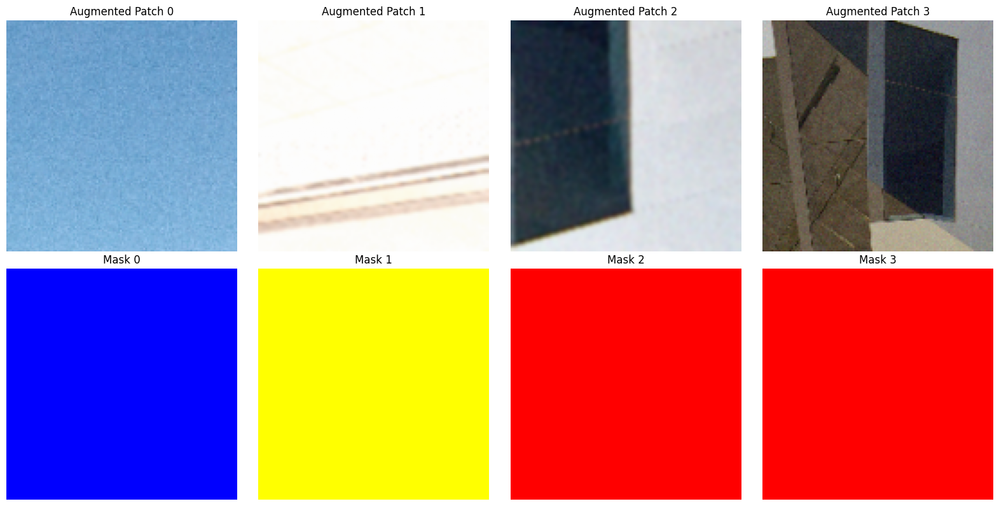

In [34]:
train_dataset = SegmentationDataset(image, label_map, train_mask, 
                                     patch_size=128, num_patches=2000, augment=True)
val_dataset = SegmentationDataset(image, label_map, train_mask,
                                   patch_size=128, num_patches=200, augment=False)

train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=16, shuffle=False)

print("V1 datasets created using train_mask only")
print(f"Train patches: {len(train_dataset)}")
print(f"Val patches: {len(val_dataset)}")

# Visualize a few augmented patches
fig, axes = plt.subplots(2, 4, figsize=(16, 8))
for i in range(4):
    img, mask = train_dataset[i]
    img_np = img.permute(1, 2, 0).numpy()
    mask_np = mask.numpy()
    
    axes[0, i].imshow(img_np)
    axes[0, i].set_title(f"Augmented Patch {i}")
    axes[0, i].axis('off')
    
    axes[1, i].imshow(class_colors[mask_np])
    axes[1, i].set_title(f"Mask {i}")
    axes[1, i].axis('off')

plt.tight_layout()
plt.show()

## Define the U-Net

In [35]:
# U-Net architecture
class DoubleConv(nn.Module):
    """Two 3x3 convolutions with ReLU, used at each level of the U-Net"""
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
        )
    
    def forward(self, x):
        return self.conv(x)


class UNet(nn.Module):
    def __init__(self, in_channels=3, num_classes=4):
        super().__init__()
        
        # Encoder (going down the U)
        self.enc1 = DoubleConv(in_channels, 32)
        self.enc2 = DoubleConv(32, 64)
        self.enc3 = DoubleConv(64, 128)
        self.enc4 = DoubleConv(128, 256)
        
        # Bottleneck (bottom of U)
        self.bottleneck = DoubleConv(256, 512)
        
        # Decoder (going up the U)
        self.up4 = nn.ConvTranspose2d(512, 256, kernel_size=2, stride=2)
        self.dec4 = DoubleConv(512, 256)  # 512 because of skip connection
        
        self.up3 = nn.ConvTranspose2d(256, 128, kernel_size=2, stride=2)
        self.dec3 = DoubleConv(256, 128)
        
        self.up2 = nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2)
        self.dec2 = DoubleConv(128, 64)
        
        self.up1 = nn.ConvTranspose2d(64, 32, kernel_size=2, stride=2)
        self.dec1 = DoubleConv(64, 32)
        
        # Final output: predict class for each pixel
        self.final = nn.Conv2d(32, num_classes, kernel_size=1)
        
        self.pool = nn.MaxPool2d(2)
    
    def forward(self, x):
        # Encoder path - save skip connections
        e1 = self.enc1(x)            # [B, 32, 128, 128]
        e2 = self.enc2(self.pool(e1)) # [B, 64, 64, 64]
        e3 = self.enc3(self.pool(e2)) # [B, 128, 32, 32]
        e4 = self.enc4(self.pool(e3)) # [B, 256, 16, 16]
        
        # Bottleneck
        b = self.bottleneck(self.pool(e4))  # [B, 512, 8, 8]
        
        # Decoder path - concatenate skip connections
        d4 = self.up4(b)                          # [B, 256, 16, 16]
        d4 = self.dec4(torch.cat([d4, e4], dim=1))  # skip from e4
        
        d3 = self.up3(d4)
        d3 = self.dec3(torch.cat([d3, e3], dim=1))
        
        d2 = self.up2(d3)
        d2 = self.dec2(torch.cat([d2, e2], dim=1))
        
        d1 = self.up1(d2)
        d1 = self.dec1(torch.cat([d1, e1], dim=1))
        
        # Final output: per-pixel class scores
        out = self.final(d1)
        return out

In [36]:
# Create the model
model = UNet(in_channels=3, num_classes=NUM_CLASSES).to(device)

total_params = sum(p.numel() for p in model.parameters())
print(f"Total parameters: {total_params:,}")

# Test forward pass
dummy_input = torch.randn(2, 3, 128, 128).to(device)
output = model(dummy_input)
print(f"Input shape: {dummy_input.shape}")
print(f"Output shape: {output.shape}")

Total parameters: 7,766,084
Input shape: torch.Size([2, 3, 128, 128])
Output shape: torch.Size([2, 4, 128, 128])


## Train the model

In [37]:
model_v1 = UNet(in_channels=3, num_classes=NUM_CLASSES).to(device)
history_v1 = train_model(model_v1, train_loader, val_loader, num_epochs=50, label="Model V1 (train_mask only)")

Training Model V1 (train_mask only)...
----------------------------------------------------------------------
Epoch  1/50 | Train Loss: 0.6843 | Train Acc: 74.68% | Val Loss: 0.4848 | Val Acc: 82.92%
Epoch  2/50 | Train Loss: 0.5121 | Train Acc: 80.10% | Val Loss: 0.4223 | Val Acc: 76.90%
Epoch  3/50 | Train Loss: 0.4830 | Train Acc: 80.33% | Val Loss: 0.3597 | Val Acc: 86.81%
Epoch  4/50 | Train Loss: 0.4455 | Train Acc: 82.38% | Val Loss: 0.4447 | Val Acc: 81.52%
Epoch  5/50 | Train Loss: 0.4264 | Train Acc: 82.77% | Val Loss: 0.3930 | Val Acc: 79.21%
Epoch  6/50 | Train Loss: 0.4107 | Train Acc: 84.06% | Val Loss: 0.3613 | Val Acc: 85.38%
Epoch  7/50 | Train Loss: 0.4157 | Train Acc: 83.43% | Val Loss: 0.3736 | Val Acc: 85.22%
Epoch  8/50 | Train Loss: 0.3594 | Train Acc: 86.27% | Val Loss: 0.4111 | Val Acc: 82.69%
Epoch  9/50 | Train Loss: 0.3861 | Train Acc: 84.87% | Val Loss: 0.3972 | Val Acc: 84.95%
Epoch 10/50 | Train Loss: 0.3573 | Train Acc: 86.62% | Val Loss: 0.3869 | Val Ac

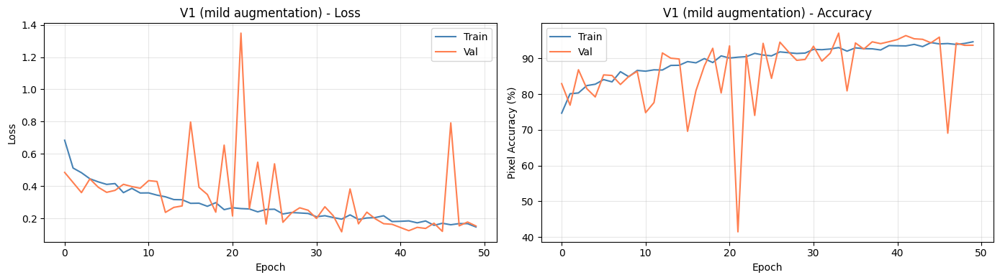

V1 final - Train Loss: 0.1466, Train Acc: 94.63%
V1 final - Val Loss: 0.1525, Val Acc: 93.67%


In [38]:
# Plot V1 training curves
fig, axes = plt.subplots(1, 2, figsize=(14, 4))

axes[0].plot(history_v1['train_loss'], label='Train', color='steelblue')
axes[0].plot(history_v1['val_loss'], label='Val', color='coral')
axes[0].set_xlabel("Epoch")
axes[0].set_ylabel("Loss")
axes[0].set_title("V1 (mild augmentation) - Loss")
axes[0].legend()
axes[0].grid(True, alpha=0.3)

axes[1].plot(history_v1['train_acc'], label='Train', color='steelblue')
axes[1].plot(history_v1['val_acc'], label='Val', color='coral')
axes[1].set_xlabel("Epoch")
axes[1].set_ylabel("Pixel Accuracy (%)")
axes[1].set_title("V1 (mild augmentation) - Accuracy")
axes[1].legend()
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig('v1_training_curves.png', dpi=150, bbox_inches='tight')
plt.show()

print(f"V1 final - Train Loss: {history_v1['train_loss'][-1]:.4f}, Train Acc: {history_v1['train_acc'][-1]:.2f}%")
print(f"V1 final - Val Loss: {history_v1['val_loss'][-1]:.4f}, Val Acc: {history_v1['val_acc'][-1]:.2f}%")

## Segment the full image

In [39]:
def segment_full_image(model, image, patch_size=128, stride=32):
    """Slide window across the full image and aggregate predictions"""
    model.eval()
    h, w, _ = image.shape
    
    # We'll accumulate logits and counts at each pixel
    # Then average them at the end
    logit_sum = np.zeros((NUM_CLASSES, h, w), dtype=np.float32)
    count_map = np.zeros((h, w), dtype=np.float32)
    
    print("Generating full segmentation...")
    
    # Collect patches
    patches = []
    positions = []
    for y in range(0, h - patch_size + 1, stride):
        for x in range(0, w - patch_size + 1, stride):
            patches.append(image[y:y+patch_size, x:x+patch_size])
            positions.append((y, x))
    
    # Also handle right and bottom edges (in case dimensions don't divide evenly)
    last_y = h - patch_size
    last_x = w - patch_size
    for x in range(0, w - patch_size + 1, stride):
        patches.append(image[last_y:last_y+patch_size, x:x+patch_size])
        positions.append((last_y, x))
    for y in range(0, h - patch_size + 1, stride):
        patches.append(image[y:y+patch_size, last_x:last_x+patch_size])
        positions.append((y, last_x))
    patches.append(image[last_y:last_y+patch_size, last_x:last_x+patch_size])
    positions.append((last_y, last_x))
    
    print(f"Total patches to predict: {len(patches)}")
    
    # Process in batches
    batch_size = 16
    with torch.no_grad():
        for batch_start in range(0, len(patches), batch_size):
            batch = patches[batch_start:batch_start+batch_size]
            batch_tensor = np.stack(batch).astype(np.float32) / 255.0
            batch_tensor = torch.from_numpy(batch_tensor).permute(0, 3, 1, 2).to(device)
            
            outputs = model(batch_tensor)  # [B, 4, 128, 128]
            outputs = torch.softmax(outputs, dim=1).cpu().numpy()
            
            for k, (y, x) in enumerate(positions[batch_start:batch_start+batch_size]):
                logit_sum[:, y:y+patch_size, x:x+patch_size] += outputs[k]
                count_map[y:y+patch_size, x:x+patch_size] += 1
    
    # Average overlapping predictions
    avg_probs = logit_sum / count_map[None, :, :]
    
    # Take argmax for final prediction
    prediction = avg_probs.argmax(axis=0)
    confidence = avg_probs.max(axis=0)
    
    return prediction, confidence

Generating full segmentation...
Total patches to predict: 570


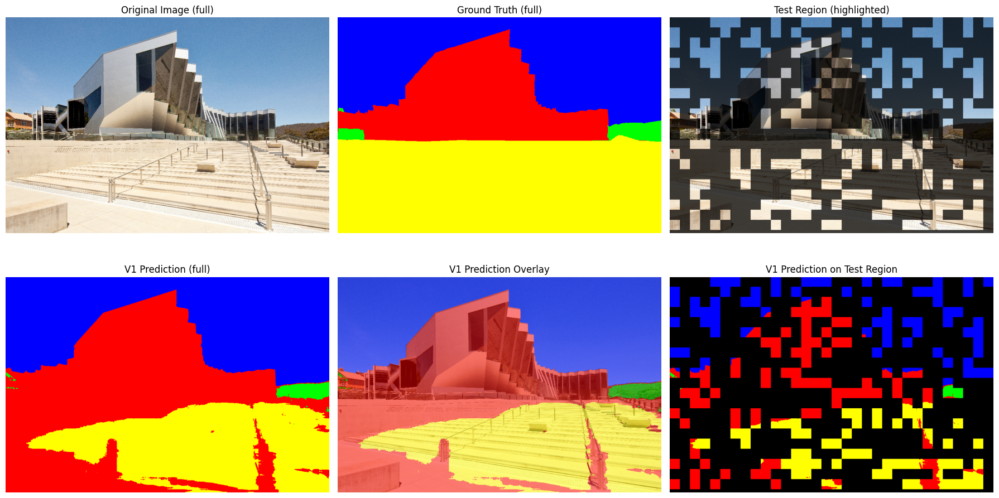


V1 Test Region Metrics:
  Pixel Accuracy: 83.73%
  Mean IoU: 66.09%
    building: 59.54%
    sky: 98.73%
    vegetation: 41.69%
    ground: 64.42%


In [47]:
# Visualize V1 predictions: full image and test region
prediction_v1, _ = segment_full_image(model_v1, image, patch_size=128, stride=32)
pred_color_v1 = class_colors[prediction_v1]
gt_color = class_colors[label_map_gt]

# Highlight test region in original image
test_overlay = image.copy()
test_overlay[~test_mask] = test_overlay[~test_mask] // 4

fig, axes = plt.subplots(2, 3, figsize=(18, 10))

# Top row: full image, ground truth, test region marked
axes[0, 0].imshow(image)
axes[0, 0].set_title("Original Image (full)")
axes[0, 0].axis('off')

axes[0, 1].imshow(gt_color)
axes[0, 1].set_title("Ground Truth (full)")
axes[0, 1].axis('off')

axes[0, 2].imshow(test_overlay)
axes[0, 2].set_title("Test Region (highlighted)")
axes[0, 2].axis('off')

# Bottom row: V1 prediction full, V1 prediction overlay, V1 on test only
axes[1, 0].imshow(pred_color_v1)
axes[1, 0].set_title("V1 Prediction (full)")
axes[1, 0].axis('off')

axes[1, 1].imshow(image)
axes[1, 1].imshow(pred_color_v1, alpha=0.5)
axes[1, 1].set_title("V1 Prediction Overlay")
axes[1, 1].axis('off')

# Show V1 prediction on test region only (mask out train region)
v1_test_only = pred_color_v1.copy()
v1_test_only[~test_mask] = v1_test_only[~test_mask] // 4
axes[1, 2].imshow(v1_test_only)
axes[1, 2].set_title("V1 Prediction on Test Region")
axes[1, 2].axis('off')

plt.tight_layout()
plt.savefig('v1_segmentation_result.png', dpi=150, bbox_inches='tight')
plt.show()

# Compute test region metrics for confirmation
test_pred = prediction_v1[test_mask]
test_gt = label_map_gt[test_mask]
pixel_acc = (test_pred == test_gt).mean() * 100
ious = []
for i in range(NUM_CLASSES):
    intersection = ((test_pred == i) & (test_gt == i)).sum()
    union = ((test_pred == i) | (test_gt == i)).sum()
    iou = intersection / (union + 1e-10) * 100
    ious.append(iou)
mean_iou = np.mean(ious)

print(f"\nV1 Test Region Metrics:")
print(f"  Pixel Accuracy: {pixel_acc:.2f}%")
print(f"  Mean IoU: {mean_iou:.2f}%")
for i, name in enumerate(CLASS_NAMES):
    print(f"    {name}: {ious[i]:.2f}%")

## More robust data experiment

### Distortion

In [48]:
def apply_distortion(image, distortion_type, severity):
    """Apply different types of distortions at varying severities"""
    img = image.copy().astype(np.float32)
    
    if distortion_type == 'blur':
        # severity: 1=mild, 5=severe
        ksize = severity * 2 + 1  # 3, 5, 7, 9, 11
        img = cv2.GaussianBlur(img, (ksize, ksize), 0)
    
    elif distortion_type == 'noise':
        # severity: 1=mild, 5=severe
        std = severity * 10  # 10, 20, 30, 40, 50
        noise = np.random.normal(0, std, img.shape)
        img = img + noise
    
    elif distortion_type == 'brightness':
        # severity: 1=slightly dimmer, 5=very dim
        factor = 1.0 - severity * 0.15  # 0.85, 0.70, 0.55, 0.40, 0.25
        img = img * factor
    
    elif distortion_type == 'contrast':
        # severity: 1=mild, 5=severe contrast reduction
        factor = 1.0 - severity * 0.15
        mean = img.mean()
        img = (img - mean) * factor + mean
    
    elif distortion_type == 'jpeg':
        # JPEG compression artifacts
        quality = max(5, 100 - severity * 18)  # 82, 64, 46, 28, 10
        encode_param = [int(cv2.IMWRITE_JPEG_QUALITY), quality]
        result, encoded = cv2.imencode('.jpg', img.astype(np.uint8), encode_param)
        img = cv2.imdecode(encoded, 1).astype(np.float32)
    
    img = np.clip(img, 0, 255).astype(np.uint8)
    return img

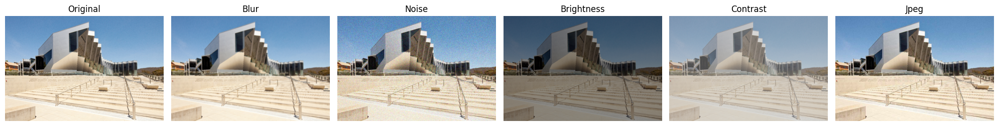

Distortion examples generated.


In [49]:
# Visualize distortions at severity 3 (medium)
distortions = ['blur', 'noise', 'brightness', 'contrast', 'jpeg']

fig, axes = plt.subplots(1, 6, figsize=(20, 4))
axes[0].imshow(image)
axes[0].set_title("Original")
axes[0].axis('off')

for i, dtype in enumerate(distortions):
    distorted = apply_distortion(image, dtype, severity=3)
    axes[i+1].imshow(distorted)
    axes[i+1].set_title(f"{dtype.capitalize()}")
    axes[i+1].axis('off')

plt.tight_layout()
plt.savefig('distortion_examples.png', dpi=150, bbox_inches='tight')
plt.show()

print("Distortion examples generated.")

### Evaluate the robustness of the V1 model

In [50]:
# Run V1 robustness experiment, evaluating on TEST region only
print("Running robustness experiment on V1 (test region)...")
print("-" * 70)

results = {}
severities = [0, 1, 2, 3, 4, 5]

for dtype in ['original'] + distortions:
    print(f"\nTesting: {dtype}")
    results[dtype] = []
    
    for severity in severities:
        if dtype == 'original' and severity > 0:
            continue
        if dtype != 'original' and severity == 0:
            continue
        
        if dtype == 'original':
            test_image_distorted = image.copy()
        else:
            test_image_distorted = apply_distortion(image, dtype, severity)
        
        # Predict on full distorted image using V1
        prediction, _ = segment_full_image(model_v1, test_image_distorted, patch_size=128, stride=64)
        
        # Evaluate ONLY on test region
        test_pred = prediction[test_mask]
        test_gt = label_map_gt[test_mask]
        
        pixel_acc = (test_pred == test_gt).mean() * 100
        ious = []
        for i in range(NUM_CLASSES):
            intersection = ((test_pred == i) & (test_gt == i)).sum()
            union = ((test_pred == i) | (test_gt == i)).sum()
            iou = intersection / (union + 1e-10) * 100
            ious.append(iou)
        mean_iou = np.mean(ious)
        
        results[dtype].append({
            'severity': severity,
            'pixel_acc': pixel_acc,
            'mean_iou': mean_iou,
            'building_iou': ious[0],
            'sky_iou': ious[1],
            'veg_iou': ious[2],
            'ground_iou': ious[3]
        })
        
        print(f"  Severity {severity}: Pixel Acc={pixel_acc:.2f}% | Mean IoU={mean_iou:.2f}%")

print("\nDone!")

Running robustness experiment on V1 (test region)...
----------------------------------------------------------------------

Testing: original
Generating full segmentation...
Total patches to predict: 160
  Severity 0: Pixel Acc=83.87% | Mean IoU=66.17%

Testing: blur
Generating full segmentation...
Total patches to predict: 160
  Severity 1: Pixel Acc=84.25% | Mean IoU=65.59%
Generating full segmentation...
Total patches to predict: 160
  Severity 2: Pixel Acc=78.44% | Mean IoU=59.65%
Generating full segmentation...
Total patches to predict: 160
  Severity 3: Pixel Acc=67.48% | Mean IoU=49.73%
Generating full segmentation...
Total patches to predict: 160
  Severity 4: Pixel Acc=60.87% | Mean IoU=44.37%
Generating full segmentation...
Total patches to predict: 160
  Severity 5: Pixel Acc=59.12% | Mean IoU=42.99%

Testing: noise
Generating full segmentation...
Total patches to predict: 160
  Severity 1: Pixel Acc=81.95% | Mean IoU=64.30%
Generating full segmentation...
Total patches to 

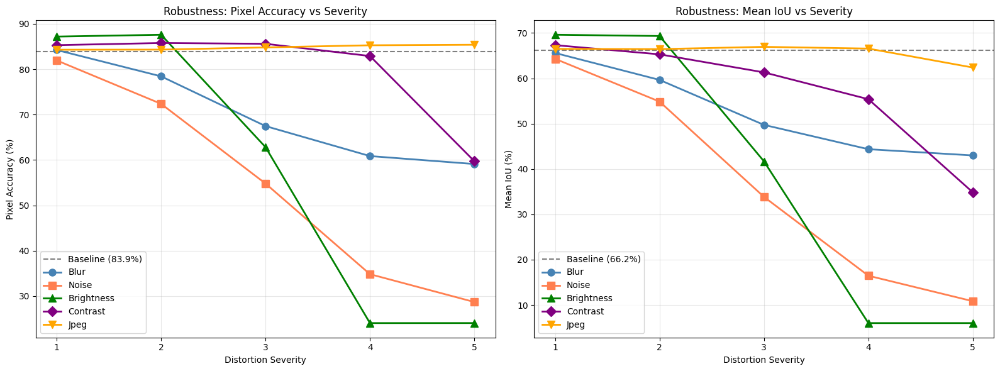


ROBUSTNESS SUMMARY TABLE
Distortion   Severity   Pixel Acc    Mean IoU    
--------------------------------------------------------------------------------
Original     -          83.87        66.17       
blur         1          84.25        65.59       
blur         2          78.44        59.65       
blur         3          67.48        49.73       
blur         4          60.87        44.37       
blur         5          59.12        42.99       
noise        1          81.95        64.30       
noise        2          72.38        54.87       
noise        3          54.81        33.85       
noise        4          34.84        16.46       
noise        5          28.71        10.84       
brightness   1          87.20        69.61       
brightness   2          87.61        69.33       
brightness   3          62.84        41.69       
brightness   4          24.07        6.02        
brightness   5          24.07        6.02        
contrast     1          85.31        67.32 

In [51]:
# Plot how each metric degrades as severity increases
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

baseline_acc = results['original'][0]['pixel_acc']
baseline_iou = results['original'][0]['mean_iou']

colors = {'blur': 'steelblue', 'noise': 'coral', 'brightness': 'green', 
          'contrast': 'purple', 'jpeg': 'orange'}
markers = {'blur': 'o', 'noise': 's', 'brightness': '^', 
           'contrast': 'D', 'jpeg': 'v'}

# Plot pixel accuracy
ax = axes[0]
ax.axhline(y=baseline_acc, color='black', linestyle='--', alpha=0.5, label=f'Baseline ({baseline_acc:.1f}%)')

for dtype in distortions:
    severities_list = [r['severity'] for r in results[dtype]]
    accs = [r['pixel_acc'] for r in results[dtype]]
    ax.plot(severities_list, accs, color=colors[dtype], marker=markers[dtype], 
            label=dtype.capitalize(), linewidth=2, markersize=8)

ax.set_xlabel("Distortion Severity")
ax.set_ylabel("Pixel Accuracy (%)")
ax.set_title("Robustness: Pixel Accuracy vs Severity")
ax.legend()
ax.grid(True, alpha=0.3)
ax.set_xticks([1, 2, 3, 4, 5])

# Plot mean IoU
ax = axes[1]
ax.axhline(y=baseline_iou, color='black', linestyle='--', alpha=0.5, label=f'Baseline ({baseline_iou:.1f}%)')

for dtype in distortions:
    severities_list = [r['severity'] for r in results[dtype]]
    ious = [r['mean_iou'] for r in results[dtype]]
    ax.plot(severities_list, ious, color=colors[dtype], marker=markers[dtype], 
            label=dtype.capitalize(), linewidth=2, markersize=8)

ax.set_xlabel("Distortion Severity")
ax.set_ylabel("Mean IoU (%)")
ax.set_title("Robustness: Mean IoU vs Severity")
ax.legend()
ax.grid(True, alpha=0.3)
ax.set_xticks([1, 2, 3, 4, 5])

plt.tight_layout()
plt.savefig('robustness_curves.png', dpi=150, bbox_inches='tight')
plt.show()

# Print summary table
print("\n" + "=" * 80)
print("ROBUSTNESS SUMMARY TABLE")
print("=" * 80)
print(f"{'Distortion':<12} {'Severity':<10} {'Pixel Acc':<12} {'Mean IoU':<12}")
print("-" * 80)
print(f"{'Original':<12} {'-':<10} {baseline_acc:<12.2f} {baseline_iou:<12.2f}")
for dtype in distortions:
    for r in results[dtype]:
        print(f"{dtype:<12} {r['severity']:<10} {r['pixel_acc']:<12.2f} {r['mean_iou']:<12.2f}")
print("=" * 80)

### Retrain with better augmentation
Due to the model failing on brightness and contrast distortion, thus we need better augmentation

In [52]:
class SegmentationDatasetWide(Dataset):
    def __init__(self, image, label_map, valid_mask, patch_size=128, num_patches=2000, augment=True):
        """
        valid_mask: boolean mask indicating which pixels are allowed (train or test region).
        Patches are only kept if their CENTRE falls inside the valid region.
        """
        self.image = image
        self.label_map = label_map
        self.valid_mask = valid_mask
        self.patch_size = patch_size
        self.num_patches = num_patches
        self.augment = augment
        self.h, self.w, _ = image.shape
    
    def __len__(self):
        return self.num_patches
    
    def __getitem__(self, idx):
        # Sample until patch centre is in valid region
        max_attempts = 100
        for _ in range(max_attempts):
            if self.augment:
                scale = random.uniform(0.7, 1.3)
                crop_size = int(self.patch_size * scale)
                crop_size = min(crop_size, min(self.h, self.w))
            else:
                crop_size = self.patch_size
            
            y = random.randint(0, self.h - crop_size)
            x = random.randint(0, self.w - crop_size)
            
            center_y = y + crop_size // 2
            center_x = x + crop_size // 2
            
            if self.valid_mask[center_y, center_x]:
                break
        
        img_patch = self.image[y:y+crop_size, x:x+crop_size].copy()
        mask_patch = self.label_map[y:y+crop_size, x:x+crop_size].copy()
        
        if crop_size != self.patch_size:
            img_patch = cv2.resize(img_patch, (self.patch_size, self.patch_size), 
                                    interpolation=cv2.INTER_LINEAR)
            mask_patch = cv2.resize(mask_patch, (self.patch_size, self.patch_size), 
                                     interpolation=cv2.INTER_NEAREST)
        
        if self.augment:
            if random.random() > 0.5:
                img_patch = np.fliplr(img_patch).copy()
                mask_patch = np.fliplr(mask_patch).copy()
            if random.random() > 0.5:
                img_patch = np.flipud(img_patch).copy()
                mask_patch = np.flipud(mask_patch).copy()
            k = random.randint(0, 3)
            img_patch = np.rot90(img_patch, k).copy()
            mask_patch = np.rot90(mask_patch, k).copy()
            
            img_pil = Image.fromarray(img_patch)
            
            # WIDER ranges
            img_pil = TF.adjust_brightness(img_pil, random.uniform(0.3, 1.5))
            img_pil = TF.adjust_contrast(img_pil, random.uniform(0.3, 1.5))
            img_pil = TF.adjust_saturation(img_pil, random.uniform(0.5, 1.5))
            img_pil = TF.adjust_hue(img_pil, random.uniform(-0.1, 0.1))
            
            img_patch = np.array(img_pil)
            
            if random.random() > 0.5:
                noise = np.random.normal(0, random.uniform(5, 15), img_patch.shape).astype(np.float32)
                img_patch = np.clip(img_patch.astype(np.float32) + noise, 0, 255).astype(np.uint8)
            
            if random.random() > 0.7:
                ksize = random.choice([3, 5, 7])
                img_patch = cv2.GaussianBlur(img_patch, (ksize, ksize), 0)
        
        img_patch = img_patch.astype(np.float32) / 255.0
        img_tensor = torch.from_numpy(img_patch).permute(2, 0, 1)
        mask_tensor = torch.from_numpy(mask_patch.astype(np.int64)).long()
        
        return img_tensor, mask_tensor


V2 datasets created using train_mask only
Train patches: 2000
Val patches: 200


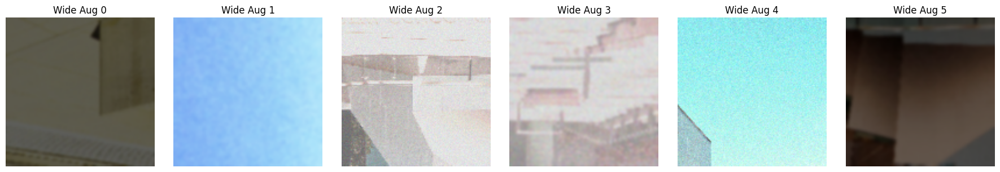

In [53]:
train_dataset_wide = SegmentationDatasetWide(image, label_map, train_mask,
                                              patch_size=128, num_patches=2000, augment=True)
val_dataset_wide = SegmentationDatasetWide(image, label_map, train_mask,
                                            patch_size=128, num_patches=200, augment=False)

train_loader_wide = DataLoader(train_dataset_wide, batch_size=16, shuffle=True)
val_loader_wide = DataLoader(val_dataset_wide, batch_size=16, shuffle=False)

print("V2 datasets created using train_mask only")
print(f"Train patches: {len(train_dataset_wide)}")
print(f"Val patches: {len(val_dataset_wide)}")

# Visualize new augmentation
fig, axes = plt.subplots(1, 6, figsize=(18, 3))
for i in range(6):
    img, mask = train_dataset_wide[i]
    img_np = img.permute(1, 2, 0).numpy()
    axes[i].imshow(img_np)
    axes[i].set_title(f"Wide Aug {i}")
    axes[i].axis('off')
plt.tight_layout()
plt.show()

### Retrain

In [54]:
model_v2 = UNet(in_channels=3, num_classes=NUM_CLASSES).to(device)
history_v2 = train_model(model_v2, train_loader_wide, val_loader_wide, num_epochs=50, label="V2 (wide aug)")

Training V2 (wide aug)...
----------------------------------------------------------------------
Epoch  1/50 | Train Loss: 0.7774 | Train Acc: 68.07% | Val Loss: 0.5428 | Val Acc: 76.66%
Epoch  2/50 | Train Loss: 0.6866 | Train Acc: 68.70% | Val Loss: 0.4752 | Val Acc: 82.09%
Epoch  3/50 | Train Loss: 0.6281 | Train Acc: 70.40% | Val Loss: 0.5943 | Val Acc: 65.43%
Epoch  4/50 | Train Loss: 0.6152 | Train Acc: 72.97% | Val Loss: 0.4663 | Val Acc: 78.88%
Epoch  5/50 | Train Loss: 0.6070 | Train Acc: 72.78% | Val Loss: 0.4496 | Val Acc: 79.57%
Epoch  6/50 | Train Loss: 0.5670 | Train Acc: 74.13% | Val Loss: 0.4214 | Val Acc: 79.85%
Epoch  7/50 | Train Loss: 0.5501 | Train Acc: 75.38% | Val Loss: 0.4579 | Val Acc: 69.81%
Epoch  8/50 | Train Loss: 0.5417 | Train Acc: 76.19% | Val Loss: 0.3454 | Val Acc: 86.66%
Epoch  9/50 | Train Loss: 0.5362 | Train Acc: 76.25% | Val Loss: 0.4219 | Val Acc: 78.51%
Epoch 10/50 | Train Loss: 0.5347 | Train Acc: 76.78% | Val Loss: 0.4039 | Val Acc: 84.19%
Epo

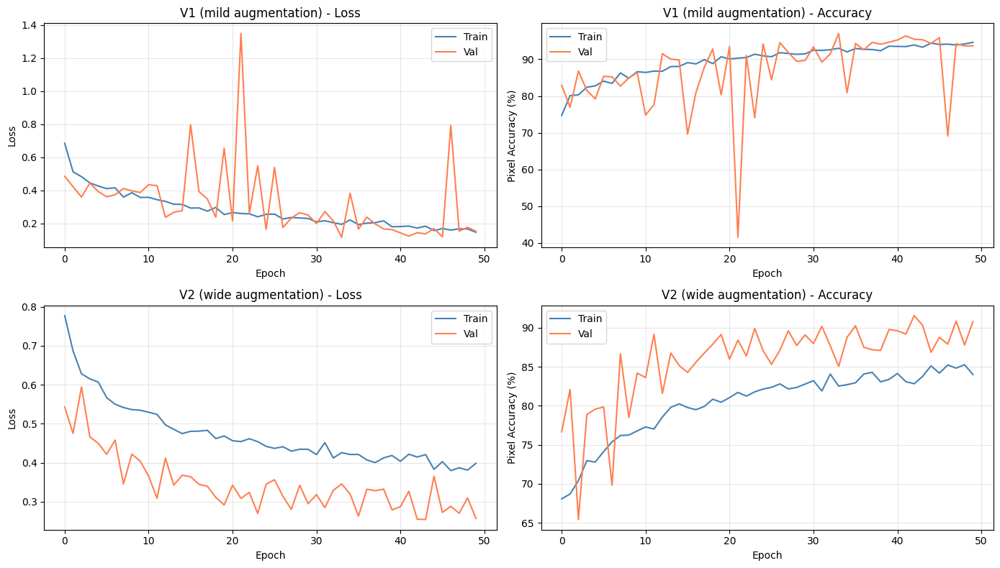


FINAL TRAINING NUMBERS

V1 (mild augmentation):
  Train Loss: 0.1466 | Train Acc: 94.63%
  Val Loss:   0.1525 | Val Acc:   93.67%

V2 (wide augmentation):
  Train Loss: 0.3984 | Train Acc: 84.00%
  Val Loss:   0.2568 | Val Acc:   90.78%


In [55]:
# Plot training curves for both V1 and V2
fig, axes = plt.subplots(2, 2, figsize=(14, 8))

# V1 loss
axes[0, 0].plot(history_v1['train_loss'], label='Train', color='steelblue')
axes[0, 0].plot(history_v1['val_loss'], label='Val', color='coral')
axes[0, 0].set_xlabel("Epoch")
axes[0, 0].set_ylabel("Loss")
axes[0, 0].set_title("V1 (mild augmentation) - Loss")
axes[0, 0].legend()
axes[0, 0].grid(True, alpha=0.3)

# V1 accuracy
axes[0, 1].plot(history_v1['train_acc'], label='Train', color='steelblue')
axes[0, 1].plot(history_v1['val_acc'], label='Val', color='coral')
axes[0, 1].set_xlabel("Epoch")
axes[0, 1].set_ylabel("Pixel Accuracy (%)")
axes[0, 1].set_title("V1 (mild augmentation) - Accuracy")
axes[0, 1].legend()
axes[0, 1].grid(True, alpha=0.3)

# V2 loss
axes[1, 0].plot(history_v2['train_loss'], label='Train', color='steelblue')
axes[1, 0].plot(history_v2['val_loss'], label='Val', color='coral')
axes[1, 0].set_xlabel("Epoch")
axes[1, 0].set_ylabel("Loss")
axes[1, 0].set_title("V2 (wide augmentation) - Loss")
axes[1, 0].legend()
axes[1, 0].grid(True, alpha=0.3)

# V2 accuracy
axes[1, 1].plot(history_v2['train_acc'], label='Train', color='steelblue')
axes[1, 1].plot(history_v2['val_acc'], label='Val', color='coral')
axes[1, 1].set_xlabel("Epoch")
axes[1, 1].set_ylabel("Pixel Accuracy (%)")
axes[1, 1].set_title("V2 (wide augmentation) - Accuracy")
axes[1, 1].legend()
axes[1, 1].grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig('training_curves.png', dpi=150, bbox_inches='tight')
plt.show()

# Print final numbers
print("\n" + "=" * 60)
print("FINAL TRAINING NUMBERS")
print("=" * 60)
print(f"\nV1 (mild augmentation):")
print(f"  Train Loss: {history_v1['train_loss'][-1]:.4f} | Train Acc: {history_v1['train_acc'][-1]:.2f}%")
print(f"  Val Loss:   {history_v1['val_loss'][-1]:.4f} | Val Acc:   {history_v1['val_acc'][-1]:.2f}%")
print(f"\nV2 (wide augmentation):")
print(f"  Train Loss: {history_v2['train_loss'][-1]:.4f} | Train Acc: {history_v2['train_acc'][-1]:.2f}%")
print(f"  Val Loss:   {history_v2['val_loss'][-1]:.4f} | Val Acc:   {history_v2['val_acc'][-1]:.2f}%")
print("=" * 60)

In [56]:
# Evaluate both models on TEST region only (the held-out 30%)

def evaluate_test_region(model, image, label_map, test_mask, model_name):
    """Generate full image prediction, then compute metrics only on test region"""
    prediction, _ = segment_full_image(model, image, patch_size=128, stride=32)
    
    # Only count pixels in test region
    test_pred = prediction[test_mask]
    test_gt = label_map[test_mask]
    
    pixel_acc = (test_pred == test_gt).mean() * 100
    
    ious = []
    for i in range(NUM_CLASSES):
        intersection = ((test_pred == i) & (test_gt == i)).sum()
        union = ((test_pred == i) | (test_gt == i)).sum()
        iou = intersection / (union + 1e-10) * 100
        ious.append(iou)
    mean_iou = np.mean(ious)
    
    print(f"\n{model_name} - TEST REGION metrics:")
    print(f"  Pixel Accuracy: {pixel_acc:.2f}%")
    print(f"  Mean IoU: {mean_iou:.2f}%")
    for i, name in enumerate(CLASS_NAMES):
        print(f"    {name}: {ious[i]:.2f}%")
    
    return prediction, pixel_acc, mean_iou, ious


In [57]:
print("=" * 60)
print("TEST REGION EVALUATION")
print("=" * 60)

prediction_v1, acc_v1, iou_v1, ious_v1 = evaluate_test_region(model_v1, image, label_map_gt, test_mask, "V1")
prediction_v2, acc_v2, iou_v2, ious_v2 = evaluate_test_region(model_v2, image, label_map_gt, test_mask, "V2")

print("\n" + "=" * 60)
print("COMPARISON")
print("=" * 60)
print(f"V1: Pixel Acc = {acc_v1:.2f}% | Mean IoU = {iou_v1:.2f}%")
print(f"V2: Pixel Acc = {acc_v2:.2f}% | Mean IoU = {iou_v2:.2f}%")

TEST REGION EVALUATION
Generating full segmentation...
Total patches to predict: 570

V1 - TEST REGION metrics:
  Pixel Accuracy: 83.73%
  Mean IoU: 66.09%
    building: 59.54%
    sky: 98.73%
    vegetation: 41.69%
    ground: 64.42%
Generating full segmentation...
Total patches to predict: 570

V2 - TEST REGION metrics:
  Pixel Accuracy: 92.56%
  Mean IoU: 65.66%
    building: 76.31%
    sky: 99.15%
    vegetation: 0.08%
    ground: 87.09%

COMPARISON
V1: Pixel Acc = 83.73% | Mean IoU = 66.09%
V2: Pixel Acc = 92.56% | Mean IoU = 65.66%


In [58]:
# Re-run robustness experiments using TEST region for evaluation
print("Running robustness experiments on test region...")
print("-" * 70)

results = {}      # V1 results
results_v2 = {}   # V2 results

severities_list = [0, 1, 2, 3, 4, 5]

for model_label, model, results_dict in [('V1', model_v1, results), ('V2', model_v2, results_v2)]:
    print(f"\n{'='*70}")
    print(f"Testing {model_label}")
    print('='*70)
    
    for dtype in ['original'] + distortions:
        print(f"\n  Distortion: {dtype}")
        results_dict[dtype] = []
        
        for severity in severities_list:
            if dtype == 'original' and severity > 0:
                continue
            if dtype != 'original' and severity == 0:
                continue
            
            if dtype == 'original':
                test_image_distorted = image.copy()
            else:
                test_image_distorted = apply_distortion(image, dtype, severity)
            
            # Predict on full distorted image
            prediction, _ = segment_full_image(model, test_image_distorted, patch_size=128, stride=64)
            
            # Evaluate ONLY on test region
            test_pred = prediction[test_mask]
            test_gt = label_map_gt[test_mask]
            
            pixel_acc = (test_pred == test_gt).mean() * 100
            ious = []
            for i in range(NUM_CLASSES):
                intersection = ((test_pred == i) & (test_gt == i)).sum()
                union = ((test_pred == i) | (test_gt == i)).sum()
                iou = intersection / (union + 1e-10) * 100
                ious.append(iou)
            mean_iou = np.mean(ious)
            
            results_dict[dtype].append({
                'severity': severity,
                'pixel_acc': pixel_acc,
                'mean_iou': mean_iou,
                'building_iou': ious[0],
                'sky_iou': ious[1],
                'veg_iou': ious[2],
                'ground_iou': ious[3]
            })
            
            print(f"    Severity {severity}: Pixel Acc={pixel_acc:.2f}% | Mean IoU={mean_iou:.2f}%")

print("\nDone!")

Running robustness experiments on test region...
----------------------------------------------------------------------

Testing V1

  Distortion: original
Generating full segmentation...
Total patches to predict: 160
    Severity 0: Pixel Acc=83.87% | Mean IoU=66.17%

  Distortion: blur
Generating full segmentation...
Total patches to predict: 160
    Severity 1: Pixel Acc=84.25% | Mean IoU=65.59%
Generating full segmentation...
Total patches to predict: 160
    Severity 2: Pixel Acc=78.44% | Mean IoU=59.65%
Generating full segmentation...
Total patches to predict: 160
    Severity 3: Pixel Acc=67.48% | Mean IoU=49.73%
Generating full segmentation...
Total patches to predict: 160
    Severity 4: Pixel Acc=60.87% | Mean IoU=44.37%
Generating full segmentation...
Total patches to predict: 160
    Severity 5: Pixel Acc=59.12% | Mean IoU=42.99%

  Distortion: noise
Generating full segmentation...
Total patches to predict: 160
    Severity 1: Pixel Acc=82.24% | Mean IoU=64.40%
Generating f

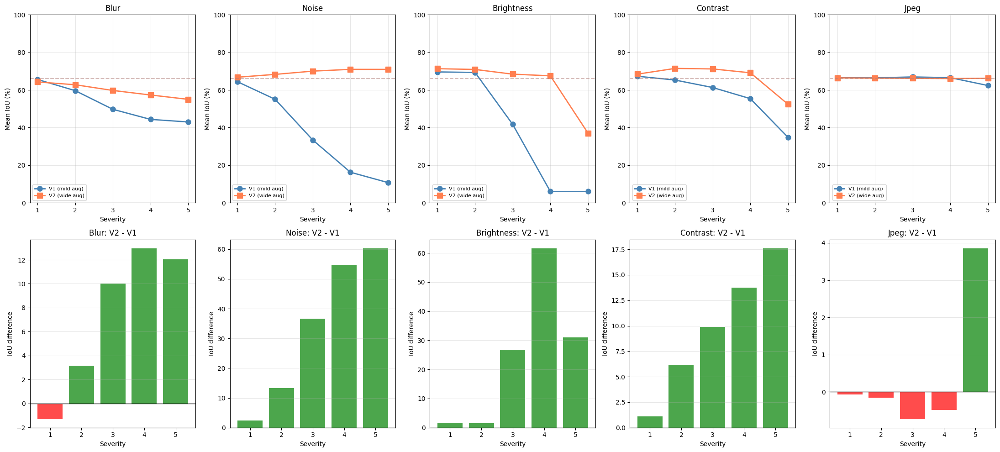


V1 vs V2 ROBUSTNESS COMPARISON (Mean IoU on test region)
Distortion   Severity   V1 IoU       V2 IoU       V2-V1       
------------------------------------------------------------------------------------------
Original     -          66.17        66.14        -0.03
blur         1          65.59        64.28        -1.31
blur         2          59.65        62.79        +3.14
blur         3          49.73        59.75        +10.02
blur         4          44.37        57.34        +12.97
blur         5          42.99        55.03        +12.04
noise        1          64.40        66.79        +2.38
noise        2          55.06        68.29        +13.24
noise        3          33.40        70.03        +36.63
noise        4          16.26        70.97        +54.70
noise        5          10.75        70.95        +60.20
brightness   1          69.61        71.32        +1.71
brightness   2          69.33        70.92        +1.59
brightness   3          41.69        68.41        +26

In [59]:
# Plot V1 vs V2 robustness on test region
fig, axes = plt.subplots(2, 5, figsize=(22, 10))

baseline_v1 = results['original'][0]['mean_iou']
baseline_v2 = results_v2['original'][0]['mean_iou']

for col, dtype in enumerate(distortions):
    ax = axes[0, col]
    severities_x = [r['severity'] for r in results[dtype]]
    
    v1_ious = [r['mean_iou'] for r in results[dtype]]
    v2_ious = [r['mean_iou'] for r in results_v2[dtype]]
    
    ax.plot(severities_x, v1_ious, 'o-', color='steelblue', label='V1 (mild aug)', linewidth=2, markersize=8)
    ax.plot(severities_x, v2_ious, 's-', color='coral', label='V2 (wide aug)', linewidth=2, markersize=8)
    ax.axhline(y=baseline_v1, color='steelblue', linestyle='--', alpha=0.3)
    ax.axhline(y=baseline_v2, color='coral', linestyle='--', alpha=0.3)
    
    ax.set_title(f"{dtype.capitalize()}")
    ax.set_xlabel("Severity")
    ax.set_ylabel("Mean IoU (%)")
    ax.legend(loc='lower left', fontsize=8)
    ax.grid(True, alpha=0.3)
    ax.set_xticks([1, 2, 3, 4, 5])
    ax.set_ylim(0, 100)
    
    # Bottom row: improvement
    ax = axes[1, col]
    improvements = [v2 - v1 for v1, v2 in zip(v1_ious, v2_ious)]
    colors = ['green' if x > 0 else 'red' for x in improvements]
    ax.bar(severities_x, improvements, color=colors, alpha=0.7)
    ax.axhline(y=0, color='black', linewidth=1)
    ax.set_title(f"{dtype.capitalize()}: V2 - V1")
    ax.set_xlabel("Severity")
    ax.set_ylabel("IoU difference")
    ax.grid(True, alpha=0.3, axis='y')
    ax.set_xticks([1, 2, 3, 4, 5])

plt.tight_layout()
plt.savefig('robustness_comparison.png', dpi=150, bbox_inches='tight')
plt.show()

# Print summary table
print("\n" + "=" * 90)
print("V1 vs V2 ROBUSTNESS COMPARISON (Mean IoU on test region)")
print("=" * 90)
print(f"{'Distortion':<12} {'Severity':<10} {'V1 IoU':<12} {'V2 IoU':<12} {'V2-V1':<12}")
print("-" * 90)
print(f"{'Original':<12} {'-':<10} {baseline_v1:<12.2f} {baseline_v2:<12.2f} {baseline_v2-baseline_v1:+.2f}")
for dtype in distortions:
    for r1, r2 in zip(results[dtype], results_v2[dtype]):
        diff = r2['mean_iou'] - r1['mean_iou']
        print(f"{dtype:<12} {r1['severity']:<10} {r1['mean_iou']:<12.2f} {r2['mean_iou']:<12.2f} {diff:+.2f}")
print("=" * 90)

Generating full segmentation...
Total patches to predict: 570
Generating full segmentation...
Total patches to predict: 570


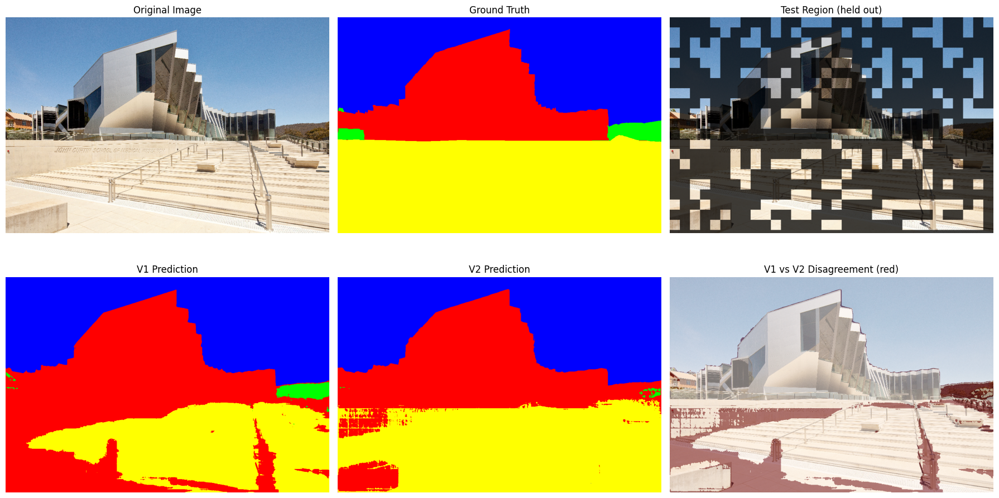

In [61]:
# Generate clean image segmentations for both models
prediction_v1, _ = segment_full_image(model_v1, image, patch_size=128, stride=32)
prediction_v2, _ = segment_full_image(model_v2, image, patch_size=128, stride=32)

pred_color_v1 = class_colors[prediction_v1]
pred_color_v2 = class_colors[prediction_v2]
gt_color = class_colors[label_map_gt]

# Show with test region highlighted
fig, axes = plt.subplots(2, 3, figsize=(18, 10))

axes[0, 0].imshow(image)
axes[0, 0].set_title("Original Image")
axes[0, 0].axis('off')

axes[0, 1].imshow(gt_color)
axes[0, 1].set_title("Ground Truth")
axes[0, 1].axis('off')

# Highlight test region
test_overlay = image.copy()
test_overlay[~test_mask] = test_overlay[~test_mask] // 4
axes[0, 2].imshow(test_overlay)
axes[0, 2].set_title("Test Region (held out)")
axes[0, 2].axis('off')

axes[1, 0].imshow(pred_color_v1)
axes[1, 0].set_title("V1 Prediction")
axes[1, 0].axis('off')

axes[1, 1].imshow(pred_color_v2)
axes[1, 1].set_title("V2 Prediction")
axes[1, 1].axis('off')

# Difference between V1 and V2
diff_map = (prediction_v1 != prediction_v2).astype(np.uint8) * 255
axes[1, 2].imshow(image)
axes[1, 2].imshow(diff_map, cmap='Reds', alpha=0.5)
axes[1, 2].set_title("V1 vs V2 Disagreement (red)")
axes[1, 2].axis('off')

plt.tight_layout()
plt.savefig('segmentation_results.png', dpi=150, bbox_inches='tight')
plt.show()

Generating full segmentation...
Total patches to predict: 160
Generating full segmentation...
Total patches to predict: 160


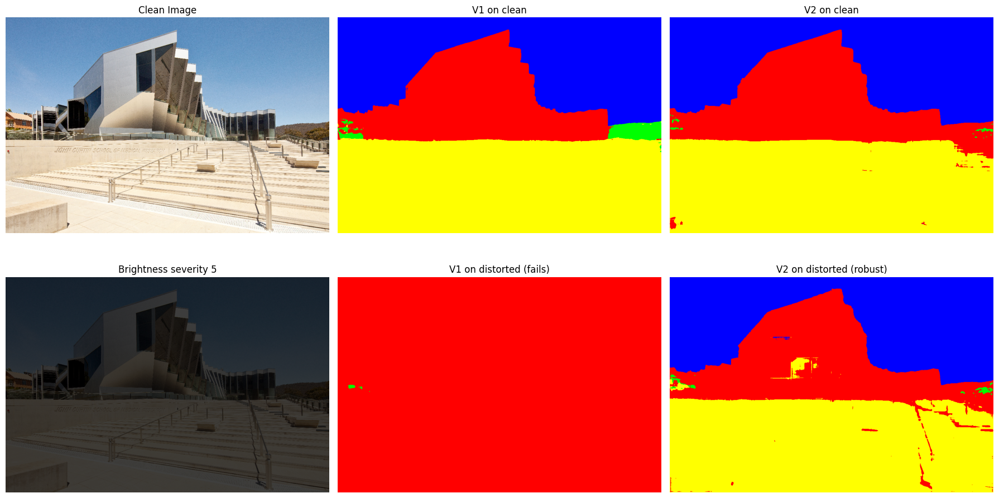

In [70]:
# Show how V1 and V2 segment the image under extreme brightness reduction
distorted = apply_distortion(image, 'brightness', severity=5)

pred_v1_dist, _ = segment_full_image(model_v1, distorted, patch_size=128, stride=64)
pred_v2_dist, _ = segment_full_image(model_v2, distorted, patch_size=128, stride=64)

pred_v1_dist_color = class_colors[pred_v1_dist]
pred_v2_dist_color = class_colors[pred_v2_dist]

fig, axes = plt.subplots(2, 3, figsize=(18, 10))

# Top: clean
axes[0, 0].imshow(image)
axes[0, 0].set_title("Clean Image")
axes[0, 0].axis('off')

axes[0, 1].imshow(pred_color_v1)
axes[0, 1].set_title("V1 on clean")
axes[0, 1].axis('off')

axes[0, 2].imshow(pred_color_v2)
axes[0, 2].set_title("V2 on clean")
axes[0, 2].axis('off')

# Bottom: distorted (brightness severity 5)
axes[1, 0].imshow(distorted)
axes[1, 0].set_title("Brightness severity 5")
axes[1, 0].axis('off')

axes[1, 1].imshow(pred_v1_dist_color)
axes[1, 1].set_title("V1 on distorted (fails)")
axes[1, 1].axis('off')

axes[1, 2].imshow(pred_v2_dist_color)
axes[1, 2].set_title("V2 on distorted (robust)")
axes[1, 2].axis('off')

plt.tight_layout()
plt.savefig('robustness_visual.png', dpi=150, bbox_inches='tight')
plt.show()

## Confusion Matrix

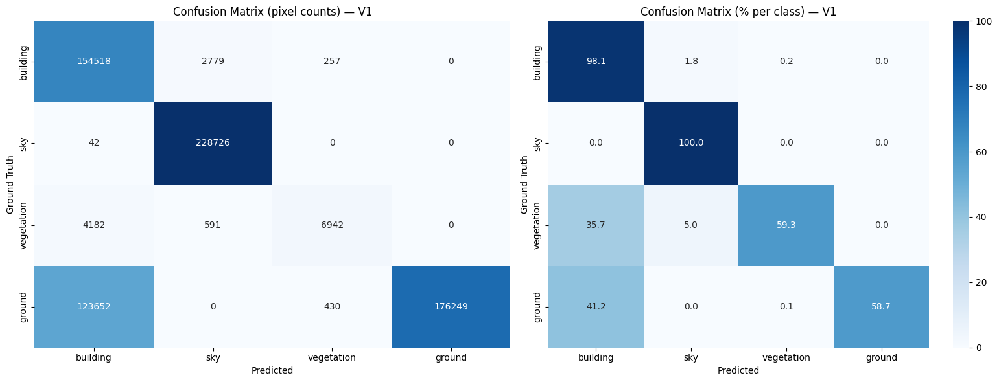


Interpretation:
  building: 98.1% correctly classified
    -> 1.8% misclassified as sky
  sky: 100.0% correctly classified
  vegetation: 59.3% correctly classified
    -> 35.7% misclassified as building
    -> 5.0% misclassified as sky
  ground: 58.7% correctly classified
    -> 41.2% misclassified as building


In [63]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

# Get V1 predictions on clean image (already computed as prediction_v1)
# Compute confusion matrix
cm = confusion_matrix(label_map_gt.flatten(), prediction_v1.flatten(), labels=[0, 1, 2, 3])

# Normalize by row (so each row sums to 100%)
cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis] * 100

fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Raw counts
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', 
            xticklabels=CLASS_NAMES, yticklabels=CLASS_NAMES,
            ax=axes[0], cbar=False)
axes[0].set_xlabel("Predicted")
axes[0].set_ylabel("Ground Truth")
axes[0].set_title("Confusion Matrix (pixel counts) — V1")

# Normalized
sns.heatmap(cm_normalized, annot=True, fmt='.1f', cmap='Blues',
            xticklabels=CLASS_NAMES, yticklabels=CLASS_NAMES,
            ax=axes[1], cbar=True, vmin=0, vmax=100)
axes[1].set_xlabel("Predicted")
axes[1].set_ylabel("Ground Truth")
axes[1].set_title("Confusion Matrix (% per class) — V1")

plt.tight_layout()
plt.savefig('confusion_matrix.png', dpi=150, bbox_inches='tight')
plt.show()

# Print interpretation
print("\nInterpretation:")
for i, name in enumerate(CLASS_NAMES):
    correct_pct = cm_normalized[i, i]
    print(f"  {name}: {correct_pct:.1f}% correctly classified")
    # Find what it gets confused with
    for j in range(NUM_CLASSES):
        if i != j and cm_normalized[i, j] > 1:
            print(f"    -> {cm_normalized[i, j]:.1f}% misclassified as {CLASS_NAMES[j]}")

In [64]:
from sklearn.metrics import precision_recall_fscore_support, classification_report, accuracy_score

# Use the test region predictions and ground truth you already computed
# (test_pred and test_gt are 1D arrays of pixels in the test region)

# Per-class precision, recall, F1
precision, recall, f1, support = precision_recall_fscore_support(
    test_gt, test_pred, labels=[0, 1, 2, 3], zero_division=0
)

# Macro averages (unweighted mean across classes)
macro_precision, macro_recall, macro_f1, _ = precision_recall_fscore_support(
    test_gt, test_pred, labels=[0, 1, 2, 3], average='macro', zero_division=0
)

# Weighted averages (weighted by class support)
weighted_precision, weighted_recall, weighted_f1, _ = precision_recall_fscore_support(
    test_gt, test_pred, labels=[0, 1, 2, 3], average='weighted', zero_division=0
)

print("=" * 70)
print("V1 PERFORMANCE METRICS (Test Region)")
print("=" * 70)
print(f"\n{'Class':<14} {'Precision':<12} {'Recall':<12} {'F1':<12} {'IoU':<12} {'Support':<10}")
print("-" * 70)
for i, name in enumerate(CLASS_NAMES):
    print(f"{name:<14} {precision[i]*100:<12.2f} {recall[i]*100:<12.2f} "
          f"{f1[i]*100:<12.2f} {ious[i]:<12.2f} {support[i]:<10}")

print("-" * 70)
print(f"{'Macro avg':<14} {macro_precision*100:<12.2f} {macro_recall*100:<12.2f} "
      f"{macro_f1*100:<12.2f} {mean_iou:<12.2f}")
print(f"{'Weighted avg':<14} {weighted_precision*100:<12.2f} {weighted_recall*100:<12.2f} "
      f"{weighted_f1*100:<12.2f}")
print("-" * 70)
print(f"\nPixel Accuracy: {pixel_acc:.2f}%")
print(f"Mean IoU:       {mean_iou:.2f}%")
print(f"Macro F1:       {macro_f1*100:.2f}%")
print("=" * 70)

V1 PERFORMANCE METRICS (Test Region)

Class          Precision    Recall       F1           IoU          Support   
----------------------------------------------------------------------
building       78.44        98.50        87.33        77.51        52263     
sky            98.99        99.62        99.31        98.62        70161     
vegetation     0.00         0.00         0.00         0.00         3878      
ground         99.86        88.93        94.08        88.82        90786     
----------------------------------------------------------------------
Macro avg      69.32        71.76        70.18        66.24       
Weighted avg   92.64        93.10        92.46       
----------------------------------------------------------------------

Pixel Accuracy: 93.10%
Mean IoU:       66.24%
Macro F1:       70.18%


In [67]:
# Run V2 on full image
prediction_v2, _ = segment_full_image(model_v2, image, patch_size=128, stride=32)

# Restrict to test region with hand-drawn ground truth
test_pred_v2 = prediction_v2[test_mask]
test_gt_v2 = label_map_gt[test_mask]

# Pixel accuracy
pixel_acc_v2 = (test_pred_v2 == test_gt_v2).mean() * 100

# Per-class IoU
ious_v2 = []
for i in range(NUM_CLASSES):
    intersection = ((test_pred_v2 == i) & (test_gt_v2 == i)).sum()
    union = ((test_pred_v2 == i) | (test_gt_v2 == i)).sum()
    iou = intersection / (union + 1e-10) * 100
    ious_v2.append(iou)
mean_iou_v2 = np.mean(ious_v2)

# Per-class precision, recall, F1
precision_v2, recall_v2, f1_v2, support_v2 = precision_recall_fscore_support(
    test_gt_v2, test_pred_v2, labels=[0, 1, 2, 3], zero_division=0
)

# Macro & weighted averages
macro_precision_v2, macro_recall_v2, macro_f1_v2, _ = precision_recall_fscore_support(
    test_gt_v2, test_pred_v2, labels=[0, 1, 2, 3], average='macro', zero_division=0
)
weighted_precision_v2, weighted_recall_v2, weighted_f1_v2, _ = precision_recall_fscore_support(
    test_gt_v2, test_pred_v2, labels=[0, 1, 2, 3], average='weighted', zero_division=0
)

# Print summary table
print("=" * 70)
print("V2 PERFORMANCE METRICS (Test Region)")
print("=" * 70)
print(f"\n{'Class':<14} {'Precision':<12} {'Recall':<12} {'F1':<12} {'IoU':<12} {'Support':<10}")
print("-" * 70)
for i, name in enumerate(CLASS_NAMES):
    print(f"{name:<14} {precision_v2[i]*100:<12.2f} {recall_v2[i]*100:<12.2f} "
          f"{f1_v2[i]*100:<12.2f} {ious_v2[i]:<12.2f} {support_v2[i]:<10}")

print("-" * 70)
print(f"{'Macro avg':<14} {macro_precision_v2*100:<12.2f} {macro_recall_v2*100:<12.2f} "
      f"{macro_f1_v2*100:<12.2f} {mean_iou_v2:<12.2f}")
print(f"{'Weighted avg':<14} {weighted_precision_v2*100:<12.2f} {weighted_recall_v2*100:<12.2f} "
      f"{weighted_f1_v2*100:<12.2f}")
print("-" * 70)
print(f"\nPixel Accuracy: {pixel_acc_v2:.2f}%")
print(f"Mean IoU:       {mean_iou_v2:.2f}%")
print(f"Macro F1:       {macro_f1_v2*100:.2f}%")
print("=" * 70)

# Sklearn classification report
print("\n" + classification_report(
    test_gt_v2, test_pred_v2,
    labels=[0, 1, 2, 3],
    target_names=CLASS_NAMES,
    digits=3,
    zero_division=0
))

# V1 vs V2 comparison
print("=" * 70)
print("V1 vs V2 COMPARISON")
print("=" * 70)
print(f"{'Metric':<20} {'V1':<12} {'V2':<12} {'V2 - V1':<12}")
print("-" * 70)
print(f"{'Pixel Accuracy':<20} {pixel_acc:<12.2f} {pixel_acc_v2:<12.2f} {pixel_acc_v2-pixel_acc:+.2f}")
print(f"{'Mean IoU':<20} {mean_iou:<12.2f} {mean_iou_v2:<12.2f} {mean_iou_v2-mean_iou:+.2f}")
print(f"{'Macro F1':<20} {macro_f1*100:<12.2f} {macro_f1_v2*100:<12.2f} {(macro_f1_v2-macro_f1)*100:+.2f}")
print(f"{'Macro Precision':<20} {macro_precision*100:<12.2f} {macro_precision_v2*100:<12.2f} {(macro_precision_v2-macro_precision)*100:+.2f}")
print(f"{'Macro Recall':<20} {macro_recall*100:<12.2f} {macro_recall_v2*100:<12.2f} {(macro_recall_v2-macro_recall)*100:+.2f}")
print("=" * 70)

Generating full segmentation...
Total patches to predict: 570
V2 PERFORMANCE METRICS (Test Region)

Class          Precision    Recall       F1           IoU          Support   
----------------------------------------------------------------------
building       76.75        99.26        86.57        76.31        52263     
sky            99.38        99.77        99.58        99.15        70161     
vegetation     75.00        0.08         0.15         0.08         3878      
ground         100.00       87.09        93.10        87.09        90786     
----------------------------------------------------------------------
Macro avg      87.78        71.55        69.85        65.66       
Weighted avg   93.76        92.56        91.96       
----------------------------------------------------------------------

Pixel Accuracy: 92.56%
Mean IoU:       65.66%
Macro F1:       69.85%

              precision    recall  f1-score   support

    building      0.768     0.993     0.866     52